HSE, Applied Time Series Forecasitng , Winter 2022-23

<font color="blue"> HW #3 </font>

<span style="color:black; font-size: 12pt"></span>

Alexey Romanenko,
<font color="blue">alexromsput@gmail.com</font>

<h1 align="center">Organization Info</h1> 

**Оформление дз**: 
- Присылайте выполненное задание в гугл-форму: https://forms.gle/Jafoe52VmyraPbgP7
- Выполненное дз сохраните в файл Surname_w2022_23_hw3.ipynb, например, ivanov_w2022_23_hw3.ipynb

**Вопросы**:
- Присылайте вопросы в телеграм чат

**Deadilne**: <font color="red"> 31-Jan-2023 11:59:59 pm CET </font>

В случае присланного решения позже дедлайна максимальный бал буде снижен согласно формуле

$$МаксимальныйБалл=\max\bigl(3,max(0,(10-ДнейПослеДедлайна/7))) \bigr).$$
График зависимости максимально возможного балла за ДЗ от просрочки дедлайна приведён ниже: 

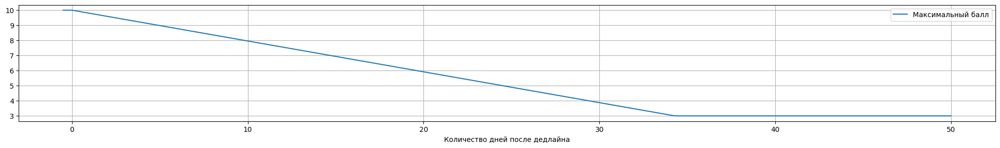

In [2]:
import pandas as pd
import numpy as np
a = 2
ax = pd.DataFrame(data = [[x, min(10, 10*max(0.3, (1-x/49)))] for x in np.linspace(-0.5,50,200)], columns = ['Количество дней после дедлайна', 'Максимальный балл']).set_index('Количество дней после дедлайна').plot(figsize = (25,3), grid = True)

<h1 align="center"> Kaggle contest (100%)</h1>

  
* Participate in kaggle contest https://www.kaggle.com/t/9552921f2eee4dada08dc692defef899

* it is allowed to use any python or R packages
* 2 benchmarks:
  - you'll get $mark \in (6, 8]$ of 10 if your approach outperforms benchmark1
  - you'll get $mark\in (8,10]$ of 10 if your approach outperforms benchmark2
  - final $mark$ will be derived based on leaderboard
  - you have to send code with the final solution to the google form https://forms.gle/Jafoe52VmyraPbgP7 (otherwise final mark will be 0)

<img src="./Screenshot_20230206_084608.png"/>

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from copy import deepcopy

from utils import qualityWAPE, qualityRMSE
import warnings, pylab

warnings.filterwarnings('ignore')

import seaborn as sns
sns.set_style("darkgrid")
pd.plotting.register_matplotlib_converters()

sns.mpl.rc("figure", figsize=(25, 5))
sns.mpl.rc("font", size=14)
from datetime import datetime

### Load data and pre-processing

In [4]:
custom_date_parser = lambda x: datetime.strptime(x, "%d.%m.%Y")

ts_retail = pd.read_csv('train_kaggle/train_kaggle.csv', parse_dates=['Date'], date_parser=custom_date_parser)
ts_retail['Date'] = pd.to_datetime(ts_retail['Date'], dayfirst = True)
ts_retail.set_index(['Date'], inplace=True)
ts_retail.head()

,Store_id,SKU_id,Promo,Demand,Regular_Price,Promo_Price
Date,,,,,,
2015-01-01,1,1,NaN,22,163.78,NaN
2015-01-02,1,1,NaN,41,163.78,NaN
2015-01-03,1,1,NaN,35,163.78,NaN
2015-01-04,1,1,NaN,72,163.78,NaN
2015-01-05,1,1,NaN,25,163.78,NaN


In [5]:
ts_retail.tail()

,Store_id,SKU_id,Promo,Demand,Regular_Price,Promo_Price
Date,,,,,,
2016-05-18,106,2,NaN,9,138.5,NaN
2016-05-19,106,2,NaN,3,138.5,NaN
2016-05-20,106,2,NaN,13,138.5,NaN
2016-05-21,106,2,NaN,3,138.5,NaN
2016-05-22,106,2,NaN,0,138.5,NaN


Let's print unique SKUs and stores.

In [6]:
skus = ts_retail['SKU_id'].unique()
print(sorted(skus))

stores = ts_retail['Store_id'].unique()
print(sorted(stores))

[1, 2]
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 104, 105, 106]


Now, let's load test part of the data set.

In [7]:
ts_retail_test = pd.read_csv('test_kaggle.csv', parse_dates=['Date'], date_parser=custom_date_parser)
ts_retail_test['Date'] = pd.to_datetime(ts_retail_test['Date'], dayfirst = True)
ts_retail_test.set_index(['Date'], inplace=True)

skus = ts_retail_test['SKU_id'].unique()
print(sorted(skus))

stores = ts_retail_test['Store_id'].unique()
print(sorted(stores))

[1, 2]
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110]


In [8]:
ts_retail_test.head()

,id,Store_id,SKU_id,Promo,Demand,Regular_Price,Promo_Price
Date,,,,,,,
2016-05-23,0,1,1,1.0,NaN,128.98,119.6
2016-05-24,1,1,1,NaN,NaN,128.98,NaN
2016-05-25,2,1,1,NaN,NaN,131.70,NaN
2016-05-26,3,1,1,NaN,NaN,131.70,NaN
2016-05-27,4,1,1,NaN,NaN,131.70,NaN


As we can see above, the Demand in the test part of the time series is set to NaN. That's expected.

Next, we will connect test and train parts of the data set to make the processing easier.

In [9]:
test_start_dt = '05-22-2016'
test_end_dt = '06-19-2016'

ts_retail = ts_retail.append(ts_retail_test)
ts_retail = ts_retail.loc[:test_end_dt]
ts_retail.head()

,Store_id,SKU_id,Promo,Demand,Regular_Price,Promo_Price,id
Date,,,,,,,
2015-01-01,1,1,NaN,22.0,163.78,NaN,NaN
2015-01-02,1,1,NaN,41.0,163.78,NaN,NaN
2015-01-03,1,1,NaN,35.0,163.78,NaN,NaN
2015-01-04,1,1,NaN,72.0,163.78,NaN,NaN
2015-01-05,1,1,NaN,25.0,163.78,NaN,NaN


In [10]:
ts_retail.tail()

,Store_id,SKU_id,Promo,Demand,Regular_Price,Promo_Price,id
Date,,,,,,,
2016-06-15,110,2,NaN,NaN,133.06,NaN,5965.0
2016-06-16,110,2,NaN,NaN,133.06,NaN,5966.0
2016-06-17,110,2,NaN,NaN,133.06,NaN,5967.0
2016-06-18,110,2,NaN,NaN,133.06,NaN,5968.0
2016-06-19,110,2,NaN,NaN,133.06,NaN,5969.0


It wouldn't hurt to have some visuals of our time series. So, let's print some plots.

<AxesSubplot: xlabel='Date'>

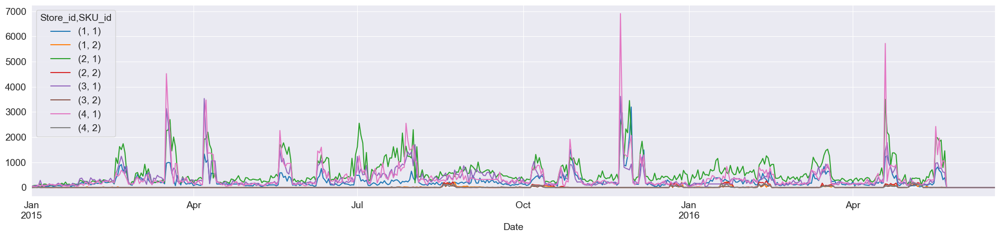

In [11]:
# Draw some time series
def plot_some_ts(ts_df, groupby_columns, time_column, target_column, ts_num = 10, aggregation_method = 'sum'):
  pivot_ts = ts_df.groupby(groupby_columns + [time_column]).agg(aggregation_method).\
     unstack(groupby_columns)[target_column]
  fig = pivot_ts[pivot_ts.columns[:ts_num]].plot()
  return fig


plot_some_ts(ts_retail.reset_index(), ['Store_id','SKU_id'], 'Date', 'Demand', ts_num = 8)

<AxesSubplot: xlabel='Date'>

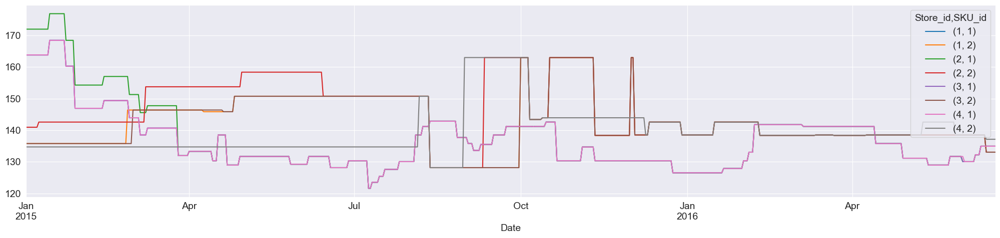

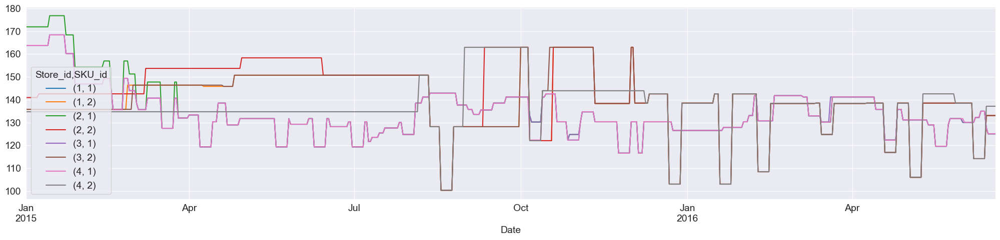

In [12]:
ts_retail['Promo'] = ts_retail['Promo'].fillna(0)
ts_retail.reset_index().set_index(['SKU_id', 'Store_id', 'Date'], inplace=True)
ts_retail['Regular_Price'] = ts_retail['Regular_Price'].ffill().bfill()
ts_retail.reset_index().set_index(['Date'], inplace=True)

plot_some_ts(ts_retail.reset_index(), ['Store_id','SKU_id'], 'Date', 'Regular_Price', ts_num = 8)

ts_retail['Actual_Price'] = ts_retail.Promo_Price.combine_first(ts_retail.Regular_Price)
ts_retail['Discount'] = ts_retail.apply(lambda row: ((row.Regular_Price - row.Promo_Price) / row.Promo_Price) * 100, axis=1)

plot_some_ts(ts_retail.reset_index(), ['Store_id','SKU_id'], 'Date', 'Actual_Price', ts_num = 8)

<AxesSubplot: xlabel='Date'>

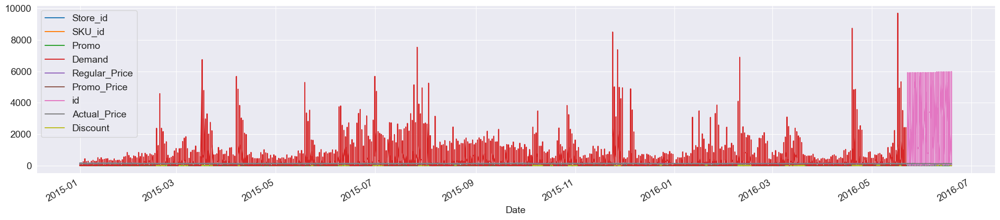

<Figure size 2500x500 with 0 Axes>

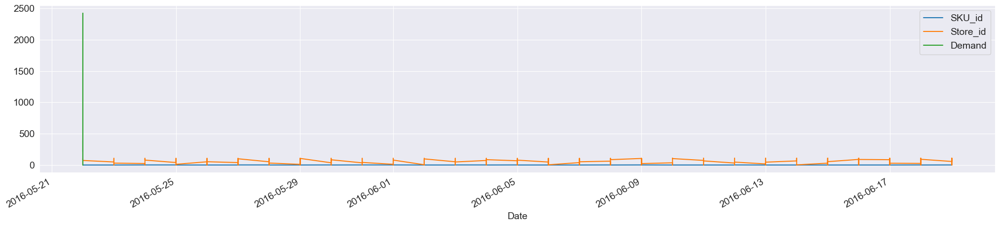

In [13]:
# prepare test/train datasets
train = ts_retail.copy(deep=True)
train.plot()
test_y = ts_retail.loc[test_start_dt:, ['SKU_id','Store_id','Demand']]

plt.figure()
test_y.plot()

### Feature engineering

<AxesSubplot: xlabel='Date'>

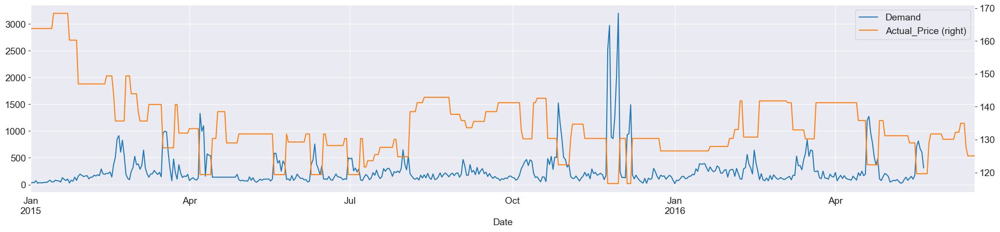

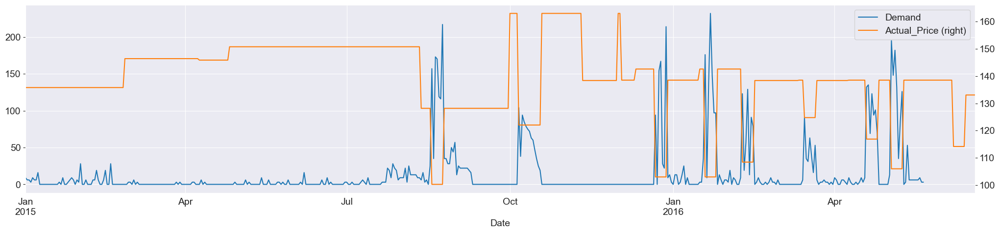

In [14]:
sales_by_sku_store = train.reset_index().set_index('Date')
sales_by_sku_store.loc[test_start_dt:,'Demand'] = np.NaN

store_1 = sales_by_sku_store[sales_by_sku_store['Store_id'] == 1]
store_1[store_1['SKU_id'] == 1][['Demand', 'Actual_Price']].plot(secondary_y = ['Actual_Price'])
store_1[store_1['SKU_id'] == 2][['Demand', 'Actual_Price']].plot(secondary_y = ['Actual_Price'])

Since we introduced `Actual_Price` we don't need `Promo_Price` and `Regular_Price` anymore. So, let's drop them. I also want to introduce a new column - `Discount`. It's pretty obvious that discount of 10% will yield less demand than a 50% discount.

In [15]:
sales_by_sku_store = sales_by_sku_store.drop('id', axis=1)
sales_by_sku_store = sales_by_sku_store.drop('Promo_Price', axis=1)
sales_by_sku_store = sales_by_sku_store.drop('Regular_Price', axis=1)
sales_by_sku_store['Discount'] = sales_by_sku_store['Discount'].replace(np.nan, 0)
sales_by_sku_store.head()

,Store_id,SKU_id,Promo,Demand,Actual_Price,Discount
Date,,,,,,
2015-01-01,1,1,0.0,22.0,163.78,0.0
2015-01-02,1,1,0.0,41.0,163.78,0.0
2015-01-03,1,1,0.0,35.0,163.78,0.0
2015-01-04,1,1,0.0,72.0,163.78,0.0
2015-01-05,1,1,0.0,25.0,163.78,0.0


Add `month`, `weekday`, and `is_weekend` columns

In [16]:
data = sales_by_sku_store.reset_index().copy(deep = True)

data["month"] = data.Date.dt.month
data["weekday"] = data.Date.dt.weekday
data['is_weekend'] = data.weekday.isin([5,6])*1

from sklearn.preprocessing import OneHotEncoder
ohe = OneHotEncoder()

# one hot for month
transformed = ohe.fit_transform(data[['month']])
data[ohe.categories_[0]] = transformed.toarray()
data = data.drop('month', axis=1)

data.head()

,Date,Store_id,SKU_id,Promo,Demand,Actual_Price,Discount,weekday,is_weekend,1,...,3,4,5,6,7,8,9,10,11,12
0,2015-01-01,1,1,0.0,22.0,163.78,0.0,3,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2015-01-02,1,1,0.0,41.0,163.78,0.0,4,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2015-01-03,1,1,0.0,35.0,163.78,0.0,5,1,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2015-01-04,1,1,0.0,72.0,163.78,0.0,6,1,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2015-01-05,1,1,0.0,25.0,163.78,0.0,0,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [17]:
data.tail()

,Date,Store_id,SKU_id,Promo,Demand,Actual_Price,Discount,weekday,is_weekend,1,...,3,4,5,6,7,8,9,10,11,12
92881,2016-06-15,110,2,0.0,NaN,133.06,0.0,2,0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
92882,2016-06-16,110,2,0.0,NaN,133.06,0.0,3,0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
92883,2016-06-17,110,2,0.0,NaN,133.06,0.0,4,0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
92884,2016-06-18,110,2,0.0,NaN,133.06,0.0,5,1,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
92885,2016-06-19,110,2,0.0,NaN,133.06,0.0,6,1,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


Lagged feature generation

In [18]:
from itertools import product
def percentile(n):
    '''Calculate n - percentile of data'''
    def percentile_(x):
        return np.percentile(x, n)
    percentile_.__name__ = 'pctl%s' % n
    return percentile_

def lagged_features(df
                    , target_var = 'demand'
                    , org_id_columns = ['product_rk', 'store_location_rk']
                    , all_id_columns =['product_rk', 'store_location_rk', 'period_start_dt']
                    , lags = [7, 14, 21, 28]
                    , windows = [7, 14]
                    , aggregation_methods = {'mean', 'median', percentile(10),  percentile(90)}
                    , filters = None
                    ):
    '''Calculate lagged features '''
    ''' df - data frame
        target_var - column name which is used to calculate lagged features
        org_id_columns - id columns, lagged featires is calculated within each id element independatnly
        all_id_columns - id columns + timestamp column
        lags - 
        windows - list of windows, calculation is performed within time range length of window
        aggregation_methods - method of aggregation, e.g. 'mean', 'median', 'std', etc.
        filter = dict of dict: {<column_name>:{'postfix':'condition of the filter'}}
    '''
    out_df = deepcopy(df)

    if filters is None:
      filters = {'':{''}}

    keys, values = zip(*filters.items())
    for bundle in product(*values):
              
      condition = ' & '.join([keys[i]+ filters[keys[i]][bundle[i]] for i in range(len(keys))])
      name =  '_'.join([bundle[i] for i in range(len(keys))])
      if len(condition) >0:
        _idx = df.eval(condition)
      else:
        _idx = df.index>=0
        
      if len(df[_idx].index)>0:
        for w in windows:
          lf_df = df[_idx].set_index(all_id_columns)[target_var].\
                    groupby(level=org_id_columns).apply(lambda x: x.rolling(window=w, min_periods = 1).agg(aggregation_methods))
          for l in lags:
            new_names = {x: "lag{0}_wdw{1}_{2}_{3}".
                          format(l, w, x, name) for x in lf_df.columns }

            out_df = pd.merge(out_df, lf_df.shift(l).reset_index().rename(columns = new_names),
                  how='left', on =all_id_columns )
            

    return out_df

In [19]:
from ipywidgets import IntProgress

from itertools import product
def percentile(n):
    '''Calculate n - percentile of data'''
    def percentile_(x):
        return np.percentile(x, n)
    percentile_.__name__ = 'pctl%s' % n
    return percentile_
    
# add missing dates to GroupBy.Core object
def fill_missing_dates(x, date_col):
    min_date, max_date = x[date_col].min(), x[date_col].max()
    groupby_day = x.groupby(pd.PeriodIndex(x[date_col], freq='D'))
    results = groupby_day.sum(min_count=1)

    idx = pd.period_range(min_date, max_date)
    results = results.reindex(idx, fill_value=np.nan)

    results.index.rename(date_col, inplace=True)

    return results


def calc_preag_fill(data, group_col, date_col, target_cols, preagg_method):
    ## calc preaggregation
    data_preag = data.groupby(group_col).agg(
        preagg_method)[target_cols].reset_index()

    ## fill missing dates
    data_preag_filled = data_preag.groupby(group_col[:-1]).apply(
        fill_missing_dates, date_col=date_col).drop(group_col[:-1],
                                                    axis=1).reset_index()

    ## return DataFrame with calculated preaggregation and filled missing dates
    return data_preag_filled


def calc_rolling(data_preag_filled, group_col, date_col, method, w):

    ## calc rolling stats
    lf_df_filled = data_preag_filled.groupby(group_col[:-1]).\
        apply(lambda x: x.set_index(date_col).rolling(window=w, min_periods=1).agg(method)).drop(group_col[:-1], axis=1)

    ## return DataFrame with rolled columns from target_vars
    return lf_df_filled


def calc_ewm(data_preag_filled, group_col, date_col, span):
    ## calc ewm stats
    lf_df_filled = data_preag_filled.groupby(group_col[:-1]).\
        apply(lambda x: x.set_index(date_col).ewm(span=span).mean()).drop(group_col[:-1], axis=1)

    ## return DataFrame with rolled columns from target_vars
    return lf_df_filled


def shift(lf_df_filled, group_col, date_col, lag):

    lf_df = lf_df_filled.groupby(
        level=group_col[:-1]).apply(lambda x: x.shift(lag)).reset_index()
    lf_df[date_col] = pd.to_datetime(lf_df[date_col].astype(str))

    ## return DataFrame with following columns: filter_col, id_cols, date_col and shifted stats
    return lf_df


def generate_lagged_features(
        data: pd.DataFrame,
        target_cols: list = ['Demand'],
        id_cols: list = ['SKU_id', 'Store_id'],
        date_col: str = 'Date',
        lags: list = [7, 14, 21, 28],
        windows: list = ['7D', '14D', '28D', '56D'],
        preagg_methods: list = ['mean'],
        agg_methods: list = ['mean', 'median', percentile(10), pd.Series.skew],
        dynamic_filters: list = ['weekday', 'Promo'],
        ewm_params: dict = {'weekday': [14, 28], 'Promo': [14, 42]}) -> pd.DataFrame:
    
    ''' 
    data - dataframe with default index
    target_cols - column names for lags calculation
    id_cols - key columns to identify unique values
    date_col - column with datetime format values
    lags - lag values(days)
    windows - windows(days/weeks/months/etc.),
        calculation is performed within time range length of window
    preagg_methods - applied methods before rolling to make
        every value unique for given id_cols
    agg_methods - method of aggregation('mean', 'median', percentile, etc.)
    dynamic_filters - column names to use as filter
    ewm_params - span values(days) for each dynamic_filter
    '''

    data = data.sort_values(date_col)
    out_df = deepcopy(data)
    dates = [min(data[date_col]), max(data[date_col])]

    total = len(target_cols) * len(lags) * len(windows) * len(preagg_methods) * len(agg_methods) * len(dynamic_filters)
    progress = IntProgress(min=0, max=total)
    display(progress)

    for filter_col in dynamic_filters:
        group_col = [filter_col] + id_cols + [date_col]
        for lag in lags:
            for preagg in preagg_methods:
                data_preag_filled = calc_preag_fill(data, group_col, date_col,
                                                    target_cols, preagg)

                ## add ewm features
                for alpha in ewm_params.get(filter_col, []):
                    ewm_filled = calc_ewm(data_preag_filled, group_col,
                                          date_col, alpha)
                    ewm = shift(ewm_filled, group_col, date_col, lag)
                    new_names = {x: "{0}_lag{1}d_alpha{2}_key{3}_preag{4}_{5}_dynamic_ewm".\
                        format(x, lag, alpha, '_'.join(id_cols), preagg, filter_col) for x in target_cols}

                    out_df = pd.merge(out_df,
                                      ewm.rename(columns=new_names),
                                      how='left',
                                      on=group_col)
                
                ## add rolling features
                for w in windows:
                    for method in agg_methods:
                        rolling_filled = calc_rolling(data_preag_filled,
                                                      group_col, date_col,
                                                      method, w)

                        ## lf_df - DataFrame with following columns: filter_col, id_cols, date_col, shifted rolling stats
                        rolling = shift(rolling_filled, group_col, date_col,
                                        lag)

                        method_name = method.__name__ if type(
                            method) != str else method

                        new_names = {x: "{0}_lag{1}d_w{2}_key{3}_preag{4}_ag{5}_{6}_dynamic_rolling".\
                                     format(x, lag, w, '_'.join(id_cols), preagg, method_name, filter_col) for x in target_cols}

                        out_df = pd.merge(out_df,
                                          rolling.rename(columns=new_names),
                                          how='left',
                                          on=group_col)
                        progress.value += 1

    return out_df

In [20]:
target_cols = ['Demand']
id_cols = ['SKU_id']
date_col = 'Date'

data_lagged_features = generate_lagged_features(data 
                    , target_cols = target_cols
                    , id_cols = id_cols
                    , date_col = date_col
                    , lags = [7, 14, 21, 28]
                    , windows = ['7D', '14D', '21D', '28D']
                    , preagg_methods = ['sum']
                    , agg_methods = [pd.Series.kurtosis, pd.Series.skew]
                    , dynamic_filters = ['Promo', 'weekday']
                    , ewm_params={'weekday': [7, 14, 21, 28], 'Promo': [7, 14, 21, 28]}
                    )

IntProgress(value=0, max=64)

In [21]:
# number of columns
print(len(data_lagged_features.columns))
data_lagged_features.columns

117


Index([                                                                'Date',
                                                                   'Store_id',
                                                                     'SKU_id',
                                                                      'Promo',
                                                                     'Demand',
                                                               'Actual_Price',
                                                                   'Discount',
                                                                    'weekday',
                                                                 'is_weekend',
                                                                            1,
       ...
               'Demand_lag28d_alpha21_keySKU_id_preagsum_weekday_dynamic_ewm',
               'Demand_lag28d_alpha28_keySKU_id_preagsum_weekday_dynamic_ewm',
        'Demand_lag28d_w7D_keySKU_id_prea

In [22]:
data_lagged_features = data_lagged_features.reset_index().set_index('Date')
data_lagged_features.head()

,index,Store_id,SKU_id,Promo,Demand,Actual_Price,Discount,weekday,is_weekend,1,...,Demand_lag28d_alpha21_keySKU_id_preagsum_weekday_dynamic_ewm,Demand_lag28d_alpha28_keySKU_id_preagsum_weekday_dynamic_ewm,Demand_lag28d_w7D_keySKU_id_preagsum_agkurt_weekday_dynamic_rolling,Demand_lag28d_w7D_keySKU_id_preagsum_agskew_weekday_dynamic_rolling,Demand_lag28d_w14D_keySKU_id_preagsum_agkurt_weekday_dynamic_rolling,Demand_lag28d_w14D_keySKU_id_preagsum_agskew_weekday_dynamic_rolling,Demand_lag28d_w21D_keySKU_id_preagsum_agkurt_weekday_dynamic_rolling,Demand_lag28d_w21D_keySKU_id_preagsum_agskew_weekday_dynamic_rolling,Demand_lag28d_w28D_keySKU_id_preagsum_agkurt_weekday_dynamic_rolling,Demand_lag28d_w28D_keySKU_id_preagsum_agskew_weekday_dynamic_rolling
Date,,,,,,,,,,,,,,,,,,,,,
2015-01-01,0,1,1,0.0,22.0,163.78,0.0,3,0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-01,1,19,1,0.0,25.0,163.78,0.0,3,0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-01,2,39,2,0.0,3.0,135.78,0.0,3,0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-01,3,40,2,0.0,0.0,135.78,0.0,3,0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-01,4,18,1,0.0,13.0,163.78,0.0,3,0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Let's drop `weekday` column. We already generated all lags we need for this feature and at this point we can either one-hot-encode `weekday` or drop it. The futher research shows that lags dominate over `weekday` in importance.

In [23]:
data_lagged_features = data_lagged_features.drop('index', axis=1)
data_lagged_features = data_lagged_features.drop('weekday', axis=1)
data_lagged_features.tail()

,Store_id,SKU_id,Promo,Demand,Actual_Price,Discount,is_weekend,1,2,3,...,Demand_lag28d_alpha21_keySKU_id_preagsum_weekday_dynamic_ewm,Demand_lag28d_alpha28_keySKU_id_preagsum_weekday_dynamic_ewm,Demand_lag28d_w7D_keySKU_id_preagsum_agkurt_weekday_dynamic_rolling,Demand_lag28d_w7D_keySKU_id_preagsum_agskew_weekday_dynamic_rolling,Demand_lag28d_w14D_keySKU_id_preagsum_agkurt_weekday_dynamic_rolling,Demand_lag28d_w14D_keySKU_id_preagsum_agskew_weekday_dynamic_rolling,Demand_lag28d_w21D_keySKU_id_preagsum_agkurt_weekday_dynamic_rolling,Demand_lag28d_w21D_keySKU_id_preagsum_agskew_weekday_dynamic_rolling,Demand_lag28d_w28D_keySKU_id_preagsum_agkurt_weekday_dynamic_rolling,Demand_lag28d_w28D_keySKU_id_preagsum_agskew_weekday_dynamic_rolling
Date,,,,,,,,,,,,,,,,,,,,,
2016-06-19,47,1,1.0,NaN,125.04,7.933461,1,0.0,0.0,0.0,...,12796.861777,15206.014402,NaN,NaN,NaN,NaN,NaN,-0.446598,0.429874,0.156316
2016-06-19,47,2,0.0,NaN,139.86,0.000000,1,0.0,0.0,0.0,...,1760.999750,2108.972295,NaN,NaN,NaN,NaN,NaN,1.701939,3.929372,1.978031
2016-06-19,48,2,0.0,NaN,137.14,0.000000,1,0.0,0.0,0.0,...,1760.999750,2108.972295,NaN,NaN,NaN,NaN,NaN,1.701939,3.929372,1.978031
2016-06-19,45,2,0.0,NaN,139.86,0.000000,1,0.0,0.0,0.0,...,1760.999750,2108.972295,NaN,NaN,NaN,NaN,NaN,1.701939,3.929372,1.978031
2016-06-19,110,2,0.0,NaN,133.06,0.000000,1,0.0,0.0,0.0,...,1760.999750,2108.972295,NaN,NaN,NaN,NaN,NaN,1.701939,3.929372,1.978031


Now let's generate separate data sets for each combination of `SKU_id` and `Store_id`

In [24]:
stores = data_lagged_features['Store_id'].unique()
skus = data_lagged_features['SKU_id'].unique()

train_sets = {}

for store_id in stores:
    for sku_id in skus:
        filtered_by_store = data_lagged_features[data_lagged_features['Store_id'] == store_id]
        filtered_by_sku_and_store = filtered_by_store[filtered_by_store['SKU_id'] == sku_id]
        
        train_sets['{store}_{sku}'.format(store = store_id, sku = sku_id)] = filtered_by_sku_and_store

Then generate regressors for each combination of `SKU_id` and `Store_id`

In [25]:
from sklearn.model_selection import GridSearchCV
import lightgbm as lgb

lgbms = {}
keys_to_remove = []

for key, value in train_sets.items():
    try:

        if value.empty:
            keys_to_remove.append(key)
            continue
        
        lgbm = lgb.LGBMRegressor(
                        n_estimators=500,
                        learning_rate=0.01,
                        feature_fraction=0.6,
                        subsample=0.4,
                        num_leaves=40,
                        metric='mae')
        
        lgbm.fit(X = value.loc[:test_start_dt].drop(['SKU_id','Store_id','Demand'], axis=1), y = value.loc[:test_start_dt].Demand)
        
        lgbms[key] = lgbm
    except Exception:
        keys_to_remove.append(key)
        
for key in keys_to_remove:
    print(key + " will use a global LGBM")
    train_sets.pop(key, None)

[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
101_1 will use a global LGBM
101_2 will use a global LGBM
103_1 will use a global LGBM
103_2 will use a global LGBM
102_1 will use a global LGBM
102_2 will use a global LGBM
107_1 will use a global LGBM
107_2 will use a global LGBM
109_1 will use a global LGBM
109_2 will use a global LGBM
110_1 will use a global LGBM
110_2 will use a global LGBM
108_1 will use a global LGBM
108_2 will use a global LGBM


Some models will fail to fit. It's not a problem. For these combinations we will use "global" LGBM-s generated for each type of `SKU_id`

In [26]:
import lightgbm as lgb
kwargs={'early_stopping_rounds':10,'verbose':2}

def plot_feature_importance(model, X , num = 20):
    feature_imp = pd.DataFrame({'Value':model.feature_importances_,'Feature':X.columns})
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value",ascending=False)[0:num])
    plt.title('LightGBM Features (avg over folds)')
    plt.tight_layout()
    plt.show()

Cross validation code from the seminar notebook

In [27]:
def performTimeSeriesCV(X_train, y_train, number_folds, model, metrics, kwargs={}):
    print('Size train set: {}'.format(X_train.shape))

    # size of a fold
    fold_size = int(np.floor(float(X_train.shape[0]) / number_folds))
    print('Size of each fold: {}'.format(fold_size))

    errors = np.zeros(number_folds-1)

    # loop from the first 2 folds to the total number of folds    
    for i in range(2, number_folds + 1):
        print('')
        train_share = float(i-1)/i
        print('Splitting the first ' + str(i) + ' chunks at ' + str(i-1) + '/' + str(i) )

        X = X_train[:(fold_size*i)]
        y = y_train[:(fold_size*i)]
        print('Size of train and test: {}'.format(X.shape)) # the size of the dataframe is going to be k*i

        index = int(np.floor(X.shape[0] * train_share))

        # folds used to train the model        
        X_trainFolds = X[:index]        
        y_trainFolds = y[:index]

        # fold used to test the model
        X_testFold = X[(index + 1):]
        y_testFold = y[(index + 1):]

        model.fit(X_trainFolds, y_trainFolds, **kwargs, eval_set=[(X_testFold, y_testFold)])
        errors[i-2] = metrics(model.predict(X_testFold), y_testFold)

    # the function returns the mean of the errors on the n-1 folds    
    return errors.mean()

Generating train sets and test sets

In [28]:
# Train sets
train_sets_II = {}

for key, value in train_sets.items():
    X_train = value.loc[:test_start_dt].drop(['SKU_id','Store_id','Demand'], axis=1)
    y_train = value.loc[:test_start_dt].Demand
    train_sets_II[key] = (X_train, y_train)

In [29]:
# test sets
test_sets = {}

for key, value in train_sets.items():
    test_sets[key] = value.loc[test_start_dt:].drop(['SKU_id','Store_id','Demand'], axis=1)

In [30]:
def wappe(y_pred, y_true):
    res = np.sum(np.abs(y_true - y_pred)) / np.sum(y_pred) * 100
    return res

In [31]:
for key, value in lgbms.items():
    try:
        (x_train, y_train) = train_sets_II[key]
    
        performTimeSeriesCV(x_train, y_train, 17, value, wappe, kwargs)
    except Exception:
        print("CV failed for " + key)

Size train set: (508, 112)
Size of each fold: 29

Splitting the first 2 chunks at 1/2
Size of train and test: (58, 112)
[2]	valid_0's l1: 163.995
[4]	valid_0's l1: 163.995
[6]	valid_0's l1: 163.995
[8]	valid_0's l1: 163.995
[10]	valid_0's l1: 163.995

Splitting the first 3 chunks at 2/3
Size of train and test: (87, 112)
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[2]	valid_0's l1: 199.228
[4]	valid_0's l1: 197.049
[6]	valid_0's l1: 195.106
[8]	valid_0's l1: 193.202
[10]	valid_0's l1: 191.37
[12]	valid_0's l1: 189.81
[14]	valid_0's l1: 188.473
[16]	valid_0's l1: 187.149
[18]	valid_0's l1: 185.852
[20]	valid_0's l1: 184.57
[22]	valid_0's l1: 183.518
[24]	valid_0's l1: 182.489
[26]	valid_0's l1: 181.479
[28]	valid_0's l1: 180.752
[30]	valid_0's l1: 180.081
[32]	valid_0's l1: 179.596
[34]	valid_0's l1: 179.264
[36]	valid_0's l1: 178.887
[38]	valid_0's l1: 178.565
[40]	valid_0's l1: 178.484
[42]	valid_0's l1: 17

The code that trains "global" LGBMS, with feature importance cuts, and cross-validation.

In [32]:
transformed = ohe.fit_transform(data_lagged_features[['Store_id']])
data_lagged_features[ohe.categories_[0]] = transformed.toarray()
data_lagged_features_no_store_id = data_lagged_features.drop('Store_id', axis=1)

sku1_train = data_lagged_features_no_store_id[data_lagged_features_no_store_id['SKU_id'] == 1]
sku2_train = data_lagged_features_no_store_id[data_lagged_features_no_store_id['SKU_id'] == 2]

lgbm_sku1 = lgb.LGBMRegressor(
                        n_estimators=500,
                        learning_rate=0.1,
                        feature_fraction=0.7,
                        subsample=0.4,
                        num_leaves=40,
                        metric='mae')

X_train1 = sku1_train.loc[:test_start_dt].drop(['SKU_id','Demand'], axis=1)
y_train1 = sku1_train.loc[:test_start_dt].Demand

lgbm_sku1.fit(X = X_train1, y = y_train1)

feature_imp = pd.DataFrame({'Value':lgbm_sku1.feature_importances_,'Feature':X_train1.columns})
feature_imp = feature_imp.sort_values(by="Value", ascending=False)[0:20]
X_train1 = X_train1[feature_imp['Feature']]

lgbm_sku2 = lgb.LGBMRegressor(
                        n_estimators=500,
                        learning_rate=0.1,
                        feature_fraction=0.7,
                        subsample=0.4,
                        num_leaves=40,
                        metric='mae')


X_train2 = sku2_train.loc[:test_start_dt].drop(['SKU_id','Demand'], axis=1)
y_train2 = sku2_train.loc[:test_start_dt].Demand

lgbm_sku2.fit(X = X_train2, y = y_train2)

feature_imp = pd.DataFrame({'Value':lgbm_sku2.feature_importances_,'Feature':X_train2.columns})
feature_imp = feature_imp.sort_values(by="Value", ascending=False)[0:20]
X_train2 = X_train2[feature_imp['Feature']]

# Test sets
X_test1 = sku1_train.loc[test_start_dt:].drop(['SKU_id','Demand'], axis=1)
X_test1 = X_test1[feature_imp['Feature']]
X_test2 = sku2_train.loc[test_start_dt:].drop(['SKU_id','Demand'], axis=1)
X_test2 = X_test2[feature_imp['Feature']]

performTimeSeriesCV(X_train1, y_train1, 17, lgbm_sku1, wappe, kwargs)
performTimeSeriesCV(X_train2, y_train2, 17, lgbm_sku2, wappe, kwargs)

Size train set: (43733, 20)
Size of each fold: 2572

Splitting the first 2 chunks at 1/2
Size of train and test: (5144, 20)
[2]	valid_0's l1: 249.436
[4]	valid_0's l1: 241.687
[6]	valid_0's l1: 236.137
[8]	valid_0's l1: 236.35
[10]	valid_0's l1: 231.925
[12]	valid_0's l1: 229.287
[14]	valid_0's l1: 227.656
[16]	valid_0's l1: 226
[18]	valid_0's l1: 225.267
[20]	valid_0's l1: 223.4
[22]	valid_0's l1: 223.588
[24]	valid_0's l1: 222.366
[26]	valid_0's l1: 221.592
[28]	valid_0's l1: 220.963
[30]	valid_0's l1: 220.661
[32]	valid_0's l1: 220.284
[34]	valid_0's l1: 220.156
[36]	valid_0's l1: 219.981
[38]	valid_0's l1: 220.014
[40]	valid_0's l1: 219.899
[42]	valid_0's l1: 219.752
[44]	valid_0's l1: 219.795
[46]	valid_0's l1: 219.641
[48]	valid_0's l1: 219.518
[50]	valid_0's l1: 219.498
[52]	valid_0's l1: 219.497
[54]	valid_0's l1: 219.499
[56]	valid_0's l1: 219.501
[58]	valid_0's l1: 219.399
[60]	valid_0's l1: 219.41
[62]	valid_0's l1: 219.371
[64]	valid_0's l1: 219.32
[66]	valid_0's l1: 219.29

182.95205352109917

Let's also tune the global lgbms with grid-search.

In [33]:
parameters = {
    'metric' : ['mae'],
    'n_estimators': [ 100, 200, 500 ],
    'learning_rate':[ 0.1, 0.05, 0.005 ],
    'feature_fraction': [ 0.6, 0.8, 0.9],
    'num_leaves':[ 20, 40, 60 ]
}

gsearch_lgbm_sku1 = GridSearchCV(lgbm_sku1, param_grid = parameters, n_jobs = 6, verbose = 10)
gsearch_lgbm_sku1.fit(X_train1, y_train1)

gsearch_lgbm_sku2 = GridSearchCV(lgbm_sku2, param_grid = parameters, n_jobs = 6, verbose = 10)
gsearch_lgbm_sku2.fit(X_train2, y_train2)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
Fitting 5 folds for each of 81 candidates, totalling 405 fits


GridSearchCV(estimator=LGBMRegressor(feature_fraction=0.7, metric='mae',
                                     n_estimators=500, num_leaves=40,
                                     subsample=0.4),
             n_jobs=6,
             param_grid={'feature_fraction': [0.6, 0.8, 0.9],
                         'learning_rate': [0.1, 0.05, 0.005], 'metric': ['mae'],
                         'n_estimators': [100, 200, 500],
                         'num_leaves': [20, 40, 60]},
             verbose=10)

### Forecasting

In [34]:
# forecast

for key, value in test_sets.items():
    value['y_pred'] = lgbms[key].predict(value)

X_test1['y_pred'] = gsearch_lgbm_sku1.predict(X_test1)
X_test2['y_pred'] = gsearch_lgbm_sku2.predict(X_test2)

<AxesSubplot: xlabel='Date'>

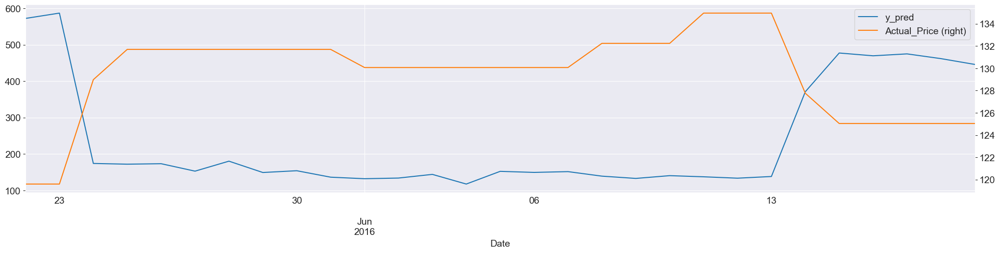

In [35]:
X_test1 = test_sets['1_1']
X_test1[['y_pred', 'Actual_Price']].plot(secondary_y = ['Actual_Price'])

<AxesSubplot: xlabel='Date'>

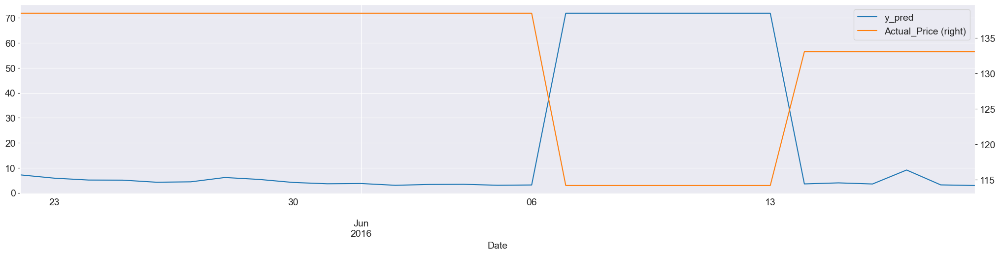

In [36]:
X_test2 = test_sets['1_2']
X_test2[['y_pred', 'Actual_Price']].plot(secondary_y = ['Actual_Price'])

Save output:

In [37]:
answer = pd.DataFrame()

for index, row in ts_retail_test.iterrows():
    key = '%i_%i' % (row['Store_id'], row['SKU_id'])
    
    if key not in test_sets.keys():
        value = 0
        
        if int(row['SKU_id']) == 1:
            value = X_test1.loc[index]['y_pred'] 
        else:
            value = X_test2.loc[index]['y_pred'] 
        
        answer = answer.append({'Demand': value }, ignore_index = True)
    else:
        x_test = test_sets[key]
        answer = answer.append({'Demand': x_test.loc[index]['y_pred'] }, ignore_index = True)
        
answer.to_csv('submission_sample.csv')

Result

<img src="./Screenshot_20230206_084608.png"/>